In [1]:
import pandas as pd
import numpy as np
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import accuracy_score, confusion_matrix, roc_auc_score, roc_curve
from pandas_profiling import ProfileReport
import sklearn
import matplotlib.pyplot as plt
from sklearn import tree
%matplotlib inline

In [2]:
df = pd.read_csv("winequality_red.csv", sep=";")

In [3]:
df

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


In [4]:
ProfileReport(df)

In [5]:
x = df.drop(columns="quality")

In [6]:
y = df["quality"]

In [7]:
x

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2


In [8]:
y

0       5
1       5
2       5
3       6
4       5
       ..
1594    5
1595    6
1596    6
1597    5
1598    6
Name: quality, Length: 1599, dtype: int64

In [9]:
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size = .20, random_state = 300)

In [10]:
dt_model = DecisionTreeClassifier()

In [11]:
dt_model.fit(x_train,y_train)

DecisionTreeClassifier()

In [12]:
dt_model.predict(x_test)

array([6, 5, 5, 7, 5, 5, 5, 5, 5, 6, 6, 6, 6, 6, 5, 6, 6, 6, 4, 5, 6, 7,
       6, 5, 7, 7, 5, 5, 7, 5, 6, 7, 6, 5, 5, 5, 5, 6, 5, 5, 5, 5, 6, 5,
       6, 5, 5, 6, 6, 6, 6, 5, 5, 5, 5, 6, 7, 5, 6, 6, 6, 7, 5, 6, 5, 5,
       7, 6, 4, 6, 5, 6, 6, 7, 6, 6, 8, 5, 6, 5, 5, 6, 6, 7, 6, 7, 5, 5,
       6, 4, 6, 6, 5, 7, 5, 4, 7, 6, 5, 5, 7, 5, 6, 6, 5, 7, 5, 5, 5, 7,
       6, 5, 5, 6, 5, 6, 4, 6, 6, 5, 6, 5, 6, 6, 6, 7, 5, 5, 6, 6, 5, 5,
       5, 5, 6, 6, 6, 7, 5, 5, 6, 5, 6, 5, 6, 6, 5, 5, 6, 5, 6, 7, 7, 5,
       6, 6, 6, 6, 6, 7, 5, 5, 6, 6, 5, 6, 6, 5, 6, 6, 7, 5, 6, 6, 6, 7,
       5, 5, 5, 5, 6, 6, 6, 6, 5, 6, 6, 6, 5, 5, 5, 5, 6, 5, 6, 6, 6, 6,
       6, 5, 5, 6, 6, 6, 6, 7, 5, 6, 5, 5, 5, 6, 7, 5, 5, 7, 5, 7, 5, 7,
       5, 5, 5, 5, 6, 3, 5, 5, 5, 5, 6, 6, 5, 7, 6, 5, 6, 5, 6, 6, 5, 6,
       6, 6, 7, 5, 5, 5, 5, 5, 7, 5, 7, 6, 5, 6, 6, 6, 5, 7, 6, 6, 5, 5,
       6, 7, 6, 5, 6, 5, 5, 6, 5, 6, 7, 5, 5, 6, 5, 7, 7, 6, 5, 6, 6, 5,
       5, 5, 6, 5, 5, 5, 6, 5, 7, 6, 6, 6, 5, 6, 5,

In [13]:
dt_model.score(x_test,y_test)

0.609375

In [14]:
dt_model_entrpy = DecisionTreeClassifier(criterion="entropy")

In [15]:
dt_model_entrpy.fit(x_train,y_train)

DecisionTreeClassifier(criterion='entropy')

In [16]:
dt_model_entrpy.score(x_test,y_test)

0.6125

In [17]:
outfile = open("dt_model_entrpy_meta.dot","w")
tree.export_graphviz(dt_model_entrpy,out_file= outfile, feature_names=x.columns)

In [18]:
dir()

['DecisionTreeClassifier',
 'GridSearchCV',
 'In',
 'Out',
 'ProfileReport',
 '_',
 '_11',
 '_12',
 '_13',
 '_15',
 '_16',
 '_3',
 '_4',
 '_7',
 '_8',
 '__',
 '___',
 '__builtin__',
 '__builtins__',
 '__doc__',
 '__loader__',
 '__name__',
 '__package__',
 '__spec__',
 '_dh',
 '_i',
 '_i1',
 '_i10',
 '_i11',
 '_i12',
 '_i13',
 '_i14',
 '_i15',
 '_i16',
 '_i17',
 '_i18',
 '_i2',
 '_i3',
 '_i4',
 '_i5',
 '_i6',
 '_i7',
 '_i8',
 '_i9',
 '_ih',
 '_ii',
 '_iii',
 '_oh',
 'accuracy_score',
 'confusion_matrix',
 'df',
 'dt_model',
 'dt_model_entrpy',
 'exit',
 'get_ipython',
 'np',
 'outfile',
 'pd',
 'plt',
 'quit',
 'roc_auc_score',
 'roc_curve',
 'sklearn',
 'train_test_split',
 'tree',
 'x',
 'x_test',
 'x_train',
 'y',
 'y_test',
 'y_train']

In [19]:
sklearn.__version__

'0.23.2'

[Text(530.6884640957446, 1064.55, 'X[10] <= 10.25\ngini = 0.639\nsamples = 1279\nvalue = [5, 43, 549, 513, 153, 16]'),
 Text(253.6661569148936, 1019.25, 'X[1] <= 0.548\ngini = 0.507\nsamples = 665\nvalue = [3, 22, 417, 208, 14, 1]'),
 Text(166.4436170212766, 973.95, 'X[6] <= 60.5\ngini = 0.551\nsamples = 297\nvalue = [0, 7, 151, 129, 9, 1]'),
 Text(100.71702127659574, 928.6500000000001, 'X[9] <= 0.645\ngini = 0.555\nsamples = 205\nvalue = [0, 5, 82, 109, 8, 1]'),
 Text(63.18723404255319, 883.35, 'X[9] <= 0.465\ngini = 0.552\nsamples = 113\nvalue = [0, 4, 59, 47, 3, 0]'),
 Text(53.293617021276596, 838.05, 'X[9] <= 0.435\ngini = 0.153\nsamples = 12\nvalue = [0, 0, 11, 1, 0, 0]'),
 Text(49.07234042553191, 792.75, 'X[4] <= 0.079\ngini = 0.5\nsamples = 2\nvalue = [0, 0, 1, 1, 0, 0]'),
 Text(44.851063829787236, 747.45, 'gini = 0.0\nsamples = 1\nvalue = [0, 0, 0, 1, 0, 0]'),
 Text(53.293617021276596, 747.45, 'gini = 0.0\nsamples = 1\nvalue = [0, 0, 1, 0, 0, 0]'),
 Text(57.51489361702127, 792.

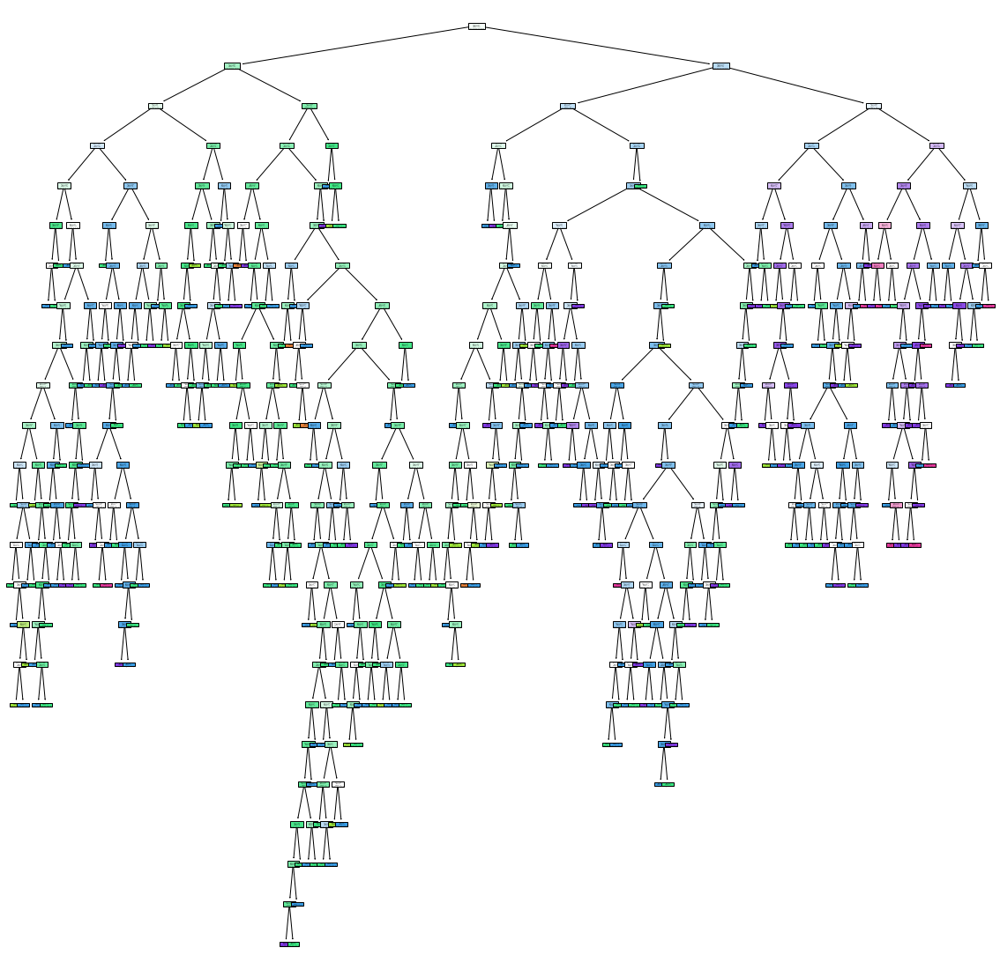

In [20]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model,filled = True)

In [21]:
df1 = df.head(500)

In [22]:
x1 = df1.drop(columns="quality")
y1 = df1.quality

In [23]:
dt_model1 = DecisionTreeClassifier()
dt_model1.fit(x1,y1)

DecisionTreeClassifier()

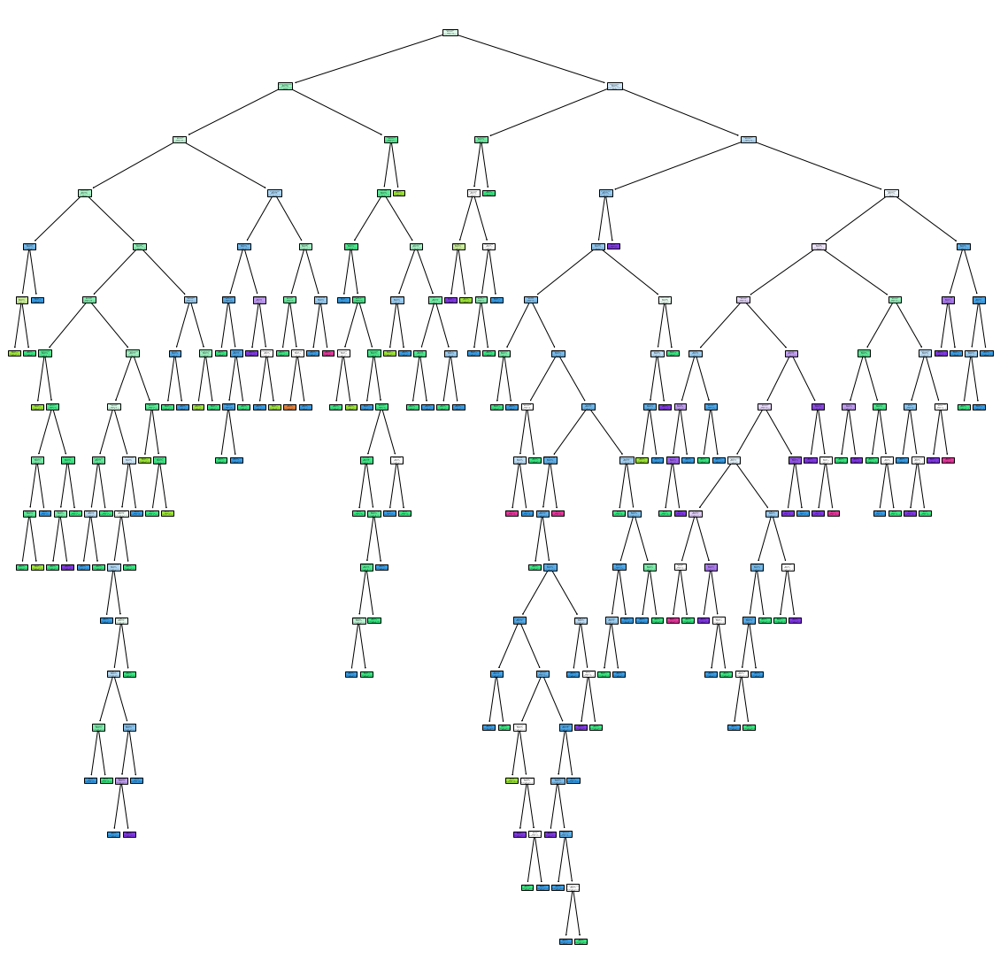

In [24]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model1,filled = True, class_names=[str(i) for i in set(y1)], feature_names= x1.columns)
plt.savefig("dt_model_1")

In [25]:
set(y1)

{3, 4, 5, 6, 7, 8}

In [26]:
#pruning operations...

dt_model1.predict(x1)

array([5, 5, 5, 6, 5, 5, 5, 7, 7, 5, 5, 5, 5, 5, 5, 5, 7, 5, 4, 6, 6, 5,
       5, 5, 6, 5, 5, 5, 5, 6, 5, 6, 5, 6, 5, 6, 6, 7, 4, 5, 5, 4, 6, 5,
       5, 4, 5, 5, 5, 5, 5, 6, 6, 5, 6, 5, 5, 5, 5, 6, 5, 5, 7, 5, 5, 5,
       5, 5, 5, 6, 6, 5, 5, 4, 5, 5, 5, 6, 5, 4, 5, 5, 5, 5, 6, 5, 6, 5,
       5, 5, 5, 6, 5, 5, 4, 6, 5, 5, 5, 6, 6, 6, 6, 5, 5, 5, 5, 5, 6, 5,
       5, 5, 5, 6, 5, 6, 6, 6, 6, 6, 5, 6, 5, 5, 5, 5, 5, 5, 7, 5, 5, 5,
       5, 6, 6, 5, 5, 5, 5, 5, 5, 5, 6, 5, 6, 5, 5, 5, 6, 6, 6, 4, 5, 5,
       5, 5, 5, 5, 5, 6, 5, 4, 6, 5, 5, 5, 5, 4, 6, 5, 4, 6, 6, 6, 5, 5,
       5, 6, 5, 5, 5, 5, 5, 5, 6, 5, 5, 5, 5, 5, 5, 6, 5, 5, 5, 5, 5, 6,
       7, 4, 7, 5, 5, 5, 6, 7, 7, 5, 5, 7, 6, 6, 6, 5, 6, 5, 5, 5, 5, 5,
       6, 5, 5, 6, 4, 6, 6, 5, 6, 5, 7, 6, 6, 5, 6, 6, 6, 6, 6, 6, 5, 6,
       6, 7, 7, 6, 5, 5, 6, 6, 6, 6, 5, 5, 6, 5, 5, 5, 5, 7, 5, 4, 5, 5,
       5, 7, 4, 8, 6, 6, 6, 6, 5, 5, 5, 6, 6, 6, 8, 7, 6, 7, 5, 7, 5, 5,
       6, 6, 7, 5, 7, 5, 6, 6, 6, 5, 5, 5, 5, 5, 6,

In [27]:
dt_model1.score(x1,y1)

1.0

In [28]:
dt_model1.score(x_test,y_test)

0.596875

In [29]:
path = dt_model1.cost_complexity_pruning_path(x1,y1)

In [30]:
path

{'ccp_alphas': array([0.        , 0.00166667, 0.00175   , 0.00181818, 0.00184615,
        0.00186667, 0.00188235, 0.00192308, 0.002     , 0.002     ,
        0.002     , 0.002     , 0.002     , 0.002     , 0.002     ,
        0.002     , 0.002     , 0.002     , 0.002     , 0.00203333,
        0.00261111, 0.00262769, 0.00266667, 0.00266667, 0.00266667,
        0.00266667, 0.00266667, 0.00266667, 0.00266667, 0.00266667,
        0.00266667, 0.00271329, 0.00272222, 0.003     , 0.003     ,
        0.003     , 0.003     , 0.00304762, 0.00304762, 0.00305051,
        0.00308418, 0.00325   , 0.00328205, 0.00333333, 0.00333333,
        0.00334032, 0.00336606, 0.00342857, 0.00343316, 0.0035    ,
        0.0035    , 0.0036    , 0.00363636, 0.00373809, 0.0038    ,
        0.0038237 , 0.004     , 0.00404444, 0.00428571, 0.00428571,
        0.00437662, 0.00462338, 0.00465709, 0.00466667, 0.0048    ,
        0.00487179, 0.00504242, 0.00508235, 0.00509091, 0.00510606,
        0.00516667, 0.00568485, 0.

In [31]:
ccp_alphas = path["ccp_alphas"]

In [32]:
ccp_alphas

array([0.        , 0.00166667, 0.00175   , 0.00181818, 0.00184615,
       0.00186667, 0.00188235, 0.00192308, 0.002     , 0.002     ,
       0.002     , 0.002     , 0.002     , 0.002     , 0.002     ,
       0.002     , 0.002     , 0.002     , 0.002     , 0.00203333,
       0.00261111, 0.00262769, 0.00266667, 0.00266667, 0.00266667,
       0.00266667, 0.00266667, 0.00266667, 0.00266667, 0.00266667,
       0.00266667, 0.00271329, 0.00272222, 0.003     , 0.003     ,
       0.003     , 0.003     , 0.00304762, 0.00304762, 0.00305051,
       0.00308418, 0.00325   , 0.00328205, 0.00333333, 0.00333333,
       0.00334032, 0.00336606, 0.00342857, 0.00343316, 0.0035    ,
       0.0035    , 0.0036    , 0.00363636, 0.00373809, 0.0038    ,
       0.0038237 , 0.004     , 0.00404444, 0.00428571, 0.00428571,
       0.00437662, 0.00462338, 0.00465709, 0.00466667, 0.0048    ,
       0.00487179, 0.00504242, 0.00508235, 0.00509091, 0.00510606,
       0.00516667, 0.00568485, 0.00589394, 0.00656364, 0.00671

In [33]:
dt_m2 = []

for ccp in ccp_alphas:
    dt_m = DecisionTreeClassifier(ccp_alpha=ccp)
    dt_m.fit(x1,y1)
    dt_m2.append(dt_m)

In [34]:
dt_m2

[DecisionTreeClassifier(),
 DecisionTreeClassifier(ccp_alpha=0.0016666666666666668),
 DecisionTreeClassifier(ccp_alpha=0.00175),
 DecisionTreeClassifier(ccp_alpha=0.0018181818181818184),
 DecisionTreeClassifier(ccp_alpha=0.0018461538461538455),
 DecisionTreeClassifier(ccp_alpha=0.001866666666666667),
 DecisionTreeClassifier(ccp_alpha=0.001882352941176471),
 DecisionTreeClassifier(ccp_alpha=0.0019230769230769243),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002033333333333334),
 DecisionTreeClassifier(ccp_alpha=0.0026111111111111114),
 Decis

#### How to perform pruning of tree?


##### By a parameter called as "CCP" , by setting a threshold of CCP, and if complexity of any of the parameter in a decission tree branch is more than that value, then it will automatically try to prune it.

In [35]:
train_score = [i.score(x1,y1) for i in dt_m2]

In [36]:
test_score = [i.score(x_test,y_test) for i in dt_m2]

In [37]:
train_score


[1.0,
 1.0,
 0.996,
 0.994,
 0.994,
 0.99,
 0.988,
 0.988,
 0.962,
 0.964,
 0.96,
 0.958,
 0.962,
 0.96,
 0.962,
 0.964,
 0.964,
 0.962,
 0.96,
 0.962,
 0.95,
 0.946,
 0.93,
 0.928,
 0.932,
 0.928,
 0.932,
 0.932,
 0.932,
 0.932,
 0.934,
 0.93,
 0.928,
 0.916,
 0.916,
 0.916,
 0.918,
 0.916,
 0.918,
 0.91,
 0.904,
 0.904,
 0.902,
 0.896,
 0.898,
 0.894,
 0.894,
 0.892,
 0.886,
 0.882,
 0.884,
 0.882,
 0.876,
 0.874,
 0.872,
 0.864,
 0.86,
 0.854,
 0.848,
 0.846,
 0.852,
 0.848,
 0.824,
 0.818,
 0.824,
 0.824,
 0.804,
 0.802,
 0.794,
 0.79,
 0.786,
 0.784,
 0.78,
 0.776,
 0.776,
 0.772,
 0.768,
 0.762,
 0.758,
 0.742,
 0.728,
 0.718,
 0.698,
 0.69,
 0.682,
 0.676,
 0.676,
 0.636,
 0.596,
 0.596,
 0.596,
 0.558,
 0.478]

In [38]:
test_score

[0.6125,
 0.596875,
 0.628125,
 0.61875,
 0.646875,
 0.6375,
 0.64375,
 0.6125,
 0.61875,
 0.628125,
 0.61875,
 0.60625,
 0.603125,
 0.59375,
 0.63125,
 0.596875,
 0.60625,
 0.603125,
 0.61875,
 0.615625,
 0.60625,
 0.628125,
 0.609375,
 0.6125,
 0.634375,
 0.603125,
 0.6125,
 0.603125,
 0.609375,
 0.61875,
 0.6,
 0.628125,
 0.621875,
 0.625,
 0.628125,
 0.625,
 0.615625,
 0.596875,
 0.5875,
 0.60625,
 0.603125,
 0.590625,
 0.575,
 0.584375,
 0.60625,
 0.596875,
 0.6,
 0.60625,
 0.6,
 0.6,
 0.5875,
 0.596875,
 0.609375,
 0.6,
 0.603125,
 0.6125,
 0.6,
 0.603125,
 0.596875,
 0.596875,
 0.603125,
 0.6,
 0.590625,
 0.58125,
 0.590625,
 0.590625,
 0.59375,
 0.59375,
 0.584375,
 0.58125,
 0.578125,
 0.575,
 0.571875,
 0.559375,
 0.565625,
 0.56875,
 0.559375,
 0.5625,
 0.55625,
 0.55625,
 0.55625,
 0.55625,
 0.546875,
 0.546875,
 0.546875,
 0.54375,
 0.54375,
 0.540625,
 0.540625,
 0.540625,
 0.540625,
 0.540625,
 0.4125]

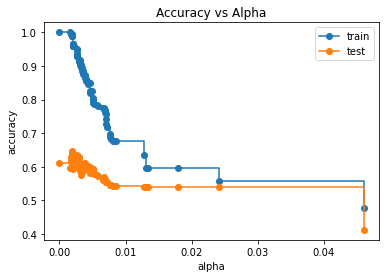

In [39]:
fig, ax = plt.subplots()
ax.set_xlabel("alpha")
ax.set_ylabel("accuracy")
ax.set_title("Accuracy vs Alpha")
ax.plot(ccp_alphas, train_score, marker='o',label= "train",drawstyle= "steps-post")
ax.plot(ccp_alphas, test_score, marker='o',label= "test",drawstyle= "steps-post")
ax.legend()
plt.show()

In [40]:
dt_model_ccp = DecisionTreeClassifier(random_state=0,ccp_alpha=0.014)
dt_model_ccp.fit(x1,y1)

DecisionTreeClassifier(ccp_alpha=0.014, random_state=0)

[Text(558.0, 906.0, 'X[10] <= 9.85\ngini = 0.624\nsamples = 500\nvalue = [1, 16, 239, 184, 52, 8]'),
 Text(279.0, 543.6, 'X[6] <= 62.5\ngini = 0.504\nsamples = 259\nvalue = [1, 12, 167, 72, 6, 1]'),
 Text(139.5, 181.19999999999993, 'gini = 0.576\nsamples = 169\nvalue = [1, 9, 91, 61, 6, 1]'),
 Text(418.5, 181.19999999999993, 'gini = 0.271\nsamples = 90\nvalue = [0, 3, 76, 11, 0, 0]'),
 Text(837.0, 543.6, 'X[9] <= 0.545\ngini = 0.657\nsamples = 241\nvalue = [0, 4, 72, 112, 46, 7]'),
 Text(697.5, 181.19999999999993, 'gini = 0.408\nsamples = 32\nvalue = [0, 2, 24, 5, 1, 0]'),
 Text(976.5, 181.19999999999993, 'gini = 0.638\nsamples = 209\nvalue = [0, 2, 48, 107, 45, 7]')]

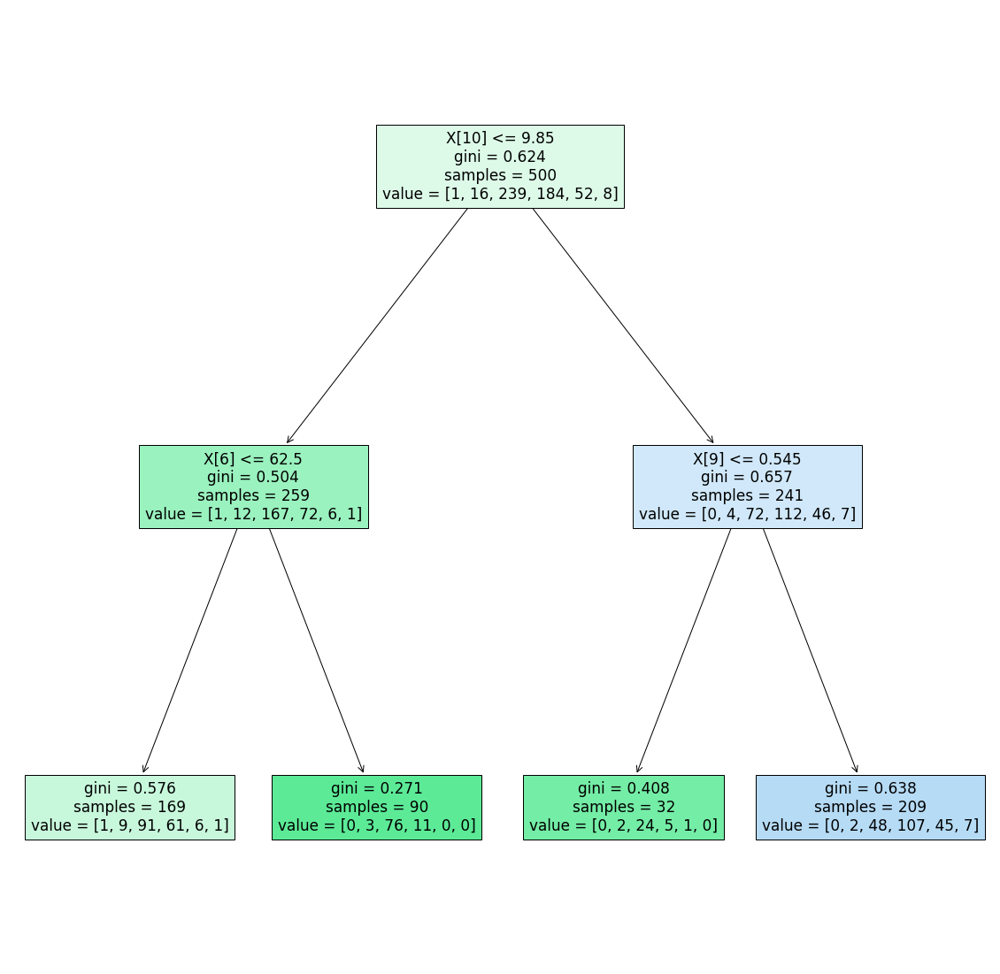

In [41]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model_ccp,filled = True)

In [42]:
dt_model_ccp.score(x1,y1)

0.596

In [43]:
dt_model_ccp.score(x_test,y_test)

0.540625

In [44]:
DecisionTreeClassifier()

DecisionTreeClassifier()

In [45]:
grid_parm = {'criterion':['gini','entropy'],
             'splitter':['best','random'],
             'max_depth':range(2,40,1),
             'min_samples_split':range(2,10,1),
             'min_samples_leaf': range(1,10,1)
             }

In [46]:
grid_ccp = GridSearchCV(estimator=dt_model_ccp,param_grid=grid_parm, cv=5, n_jobs=-1)

In [47]:
grid_ccp.fit(x1,y1)

C:\Users\DELL\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"


GridSearchCV(cv=5,
             estimator=DecisionTreeClassifier(ccp_alpha=0.014, random_state=0),
             n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': range(2, 40),
                         'min_samples_leaf': range(1, 10),
                         'min_samples_split': range(2, 10),
                         'splitter': ['best', 'random']})

In [48]:
grid_ccp.best_params_

{'criterion': 'entropy',
 'max_depth': 15,
 'min_samples_leaf': 2,
 'min_samples_split': 2,
 'splitter': 'random'}

In [49]:
dt_cpp_new=DecisionTreeClassifier(criterion='entropy',max_depth=15,min_samples_leaf=2,min_samples_split=2,splitter='random')

In [50]:
dt_cpp_new.fit(x1,y1)

DecisionTreeClassifier(criterion='entropy', max_depth=15, min_samples_leaf=2,
                       splitter='random')

In [51]:
dt_cpp_new.score(x1,y1)

0.882

In [52]:
dt_cpp_new.score(x_test,y_test)

0.584375

In [53]:
pred = dt_cpp_new.predict(x_train)

In [54]:
confusion_matrix(y_train,pred)

array([[  1,   2,   2,   0,   0,   0],
       [  1,  16,  18,   8,   0,   0],
       [  0,  26, 362, 142,  18,   1],
       [  0,  26, 145, 287,  55,   0],
       [  0,  10,  21,  56,  64,   2],
       [  0,   0,   1,   7,   6,   2]], dtype=int64)

In [55]:
df

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


In [56]:
#bagging classifier

x = df.drop(columns=["quality"])

In [57]:
y = df.quality

In [58]:
from sklearn.ensemble import BaggingClassifier

In [59]:
x_train,x_test,y_train,y_test = train_test_split(x,y,random_state =0)

In [73]:
bag_dt = BaggingClassifier(DecisionTreeClassifier(), n_estimators=100)

In [74]:
bag_dt.fit(x_train,y_train)

BaggingClassifier(base_estimator=DecisionTreeClassifier(), n_estimators=100)

In [75]:
bag_dt.predict(x_test)

array([6, 5, 7, 5, 5, 6, 5, 6, 5, 5, 5, 5, 6, 4, 5, 7, 7, 5, 5, 6, 6, 5,
       6, 7, 5, 5, 5, 7, 5, 6, 6, 6, 6, 5, 7, 7, 5, 5, 6, 6, 5, 6, 6, 7,
       6, 5, 5, 6, 5, 6, 5, 5, 6, 6, 6, 5, 5, 5, 7, 5, 5, 6, 6, 6, 5, 6,
       5, 5, 6, 6, 6, 5, 5, 5, 6, 6, 5, 5, 5, 6, 6, 5, 6, 6, 6, 6, 6, 5,
       5, 5, 5, 6, 6, 5, 7, 6, 7, 5, 5, 5, 7, 6, 6, 6, 5, 5, 5, 5, 6, 5,
       6, 5, 7, 5, 6, 6, 5, 7, 6, 6, 5, 6, 5, 5, 6, 7, 5, 5, 6, 6, 6, 6,
       6, 6, 6, 5, 6, 5, 6, 5, 6, 5, 5, 6, 5, 6, 7, 6, 5, 5, 6, 7, 5, 5,
       6, 6, 6, 6, 6, 6, 6, 6, 7, 5, 5, 5, 6, 6, 6, 6, 6, 6, 6, 7, 5, 7,
       5, 7, 7, 5, 5, 7, 6, 6, 7, 5, 6, 6, 5, 6, 6, 5, 5, 6, 5, 5, 5, 6,
       5, 5, 5, 6, 6, 6, 5, 5, 5, 6, 6, 6, 6, 6, 5, 7, 5, 6, 5, 7, 6, 5,
       5, 6, 6, 6, 6, 6, 6, 6, 6, 6, 5, 6, 5, 6, 7, 6, 6, 7, 7, 6, 5, 5,
       5, 5, 6, 5, 5, 5, 5, 7, 5, 5, 5, 5, 5, 6, 5, 5, 5, 7, 5, 6, 5, 6,
       5, 5, 5, 5, 6, 6, 5, 5, 5, 5, 6, 6, 6, 6, 6, 6, 5, 7, 5, 6, 6, 5,
       5, 5, 7, 6, 5, 5, 6, 6, 5, 6, 6, 5, 5, 5, 6,

In [63]:
bag_dt.base_estimator_

DecisionTreeClassifier()

In [64]:
bag_dt.classes_

array([3, 4, 5, 6, 7, 8], dtype=int64)

In [65]:
from sklearn.neighbors import KNeighborsClassifier

In [66]:
bag_knn = BaggingClassifier(KNeighborsClassifier(6), n_estimators=10)

In [67]:
bag_knn.fit(x_train,y_train)

BaggingClassifier(base_estimator=KNeighborsClassifier(n_neighbors=6))

In [68]:
bag_knn.predict(x_test)

array([5, 6, 7, 6, 6, 6, 6, 6, 6, 5, 5, 6, 5, 5, 6, 6, 7, 6, 6, 6, 6, 6,
       6, 5, 6, 5, 5, 6, 5, 6, 6, 6, 5, 6, 7, 7, 5, 6, 6, 6, 6, 7, 6, 7,
       6, 6, 5, 5, 5, 5, 6, 5, 7, 6, 5, 5, 5, 5, 7, 5, 5, 6, 6, 5, 5, 5,
       5, 5, 7, 7, 5, 5, 5, 5, 6, 6, 5, 6, 5, 6, 5, 5, 4, 6, 5, 6, 5, 5,
       6, 5, 5, 5, 5, 5, 5, 5, 5, 6, 6, 5, 7, 6, 6, 6, 6, 6, 6, 7, 6, 5,
       6, 5, 6, 6, 5, 7, 5, 7, 7, 6, 5, 7, 6, 5, 7, 6, 5, 5, 5, 7, 5, 5,
       6, 5, 6, 5, 6, 5, 6, 5, 6, 5, 5, 6, 5, 6, 6, 7, 6, 6, 5, 5, 7, 6,
       6, 6, 6, 6, 5, 6, 5, 6, 5, 6, 5, 5, 6, 5, 6, 5, 5, 7, 5, 7, 7, 6,
       5, 7, 7, 5, 5, 6, 6, 6, 7, 5, 6, 6, 5, 6, 5, 5, 5, 5, 5, 5, 5, 5,
       5, 5, 5, 6, 6, 6, 5, 5, 6, 6, 6, 5, 5, 5, 5, 5, 5, 5, 5, 6, 5, 5,
       5, 5, 6, 6, 6, 5, 5, 5, 5, 5, 5, 6, 5, 5, 7, 6, 7, 6, 7, 6, 6, 5,
       6, 6, 5, 5, 5, 5, 5, 5, 5, 6, 5, 6, 5, 5, 5, 6, 5, 6, 5, 6, 6, 5,
       5, 5, 6, 5, 6, 5, 5, 5, 6, 5, 7, 6, 5, 5, 6, 7, 6, 6, 5, 5, 5, 5,
       5, 5, 6, 6, 5, 5, 6, 6, 5, 6, 5, 5, 5, 5, 5,

In [69]:
from sklearn.ensemble import RandomForestClassifier

In [84]:
rf = RandomForestClassifier(n_estimators=5)

In [85]:
rf.fit(x_train,y_train)

RandomForestClassifier(n_estimators=5)

In [86]:
rf.score(x_test,y_test)

0.6175

In [81]:
bag_dt.score(x_test,y_test)

0.6925

In [82]:
bag_knn.score(x_test,y_test)

0.5125

In [87]:
rf.estimators_

[DecisionTreeClassifier(max_features='auto', random_state=471508631),
 DecisionTreeClassifier(max_features='auto', random_state=1204749526),
 DecisionTreeClassifier(max_features='auto', random_state=1449251769),
 DecisionTreeClassifier(max_features='auto', random_state=408897965),
 DecisionTreeClassifier(max_features='auto', random_state=2005804248)]

[Text(489.05725367647057, 1062.490909090909, 'X[10] <= 10.35\ngini = 0.635\nsamples = 759\nvalue = [7, 34, 510, 492, 144, 12]'),
 Text(174.64374264705882, 1013.0727272727273, 'X[1] <= 0.305\ngini = 0.512\nsamples = 432\nvalue = [3, 16, 410, 223, 17, 0]'),
 Text(21.00705882352941, 963.6545454545455, 'X[8] <= 3.22\ngini = 0.36\nsamples = 22\nvalue = [0, 1, 7, 32, 1, 0]'),
 Text(12.604235294117647, 914.2363636363636, 'X[9] <= 0.665\ngini = 0.105\nsamples = 10\nvalue = [0, 0, 0, 17, 1, 0]'),
 Text(8.402823529411764, 864.8181818181819, 'X[9] <= 0.625\ngini = 0.444\nsamples = 2\nvalue = [0, 0, 0, 2, 1, 0]'),
 Text(4.201411764705882, 815.4000000000001, 'gini = 0.0\nsamples = 1\nvalue = [0, 0, 0, 2, 0, 0]'),
 Text(12.604235294117647, 815.4000000000001, 'gini = 0.0\nsamples = 1\nvalue = [0, 0, 0, 0, 1, 0]'),
 Text(16.805647058823528, 864.8181818181819, 'gini = 0.0\nsamples = 8\nvalue = [0, 0, 0, 15, 0, 0]'),
 Text(29.409882352941175, 914.2363636363636, 'X[10] <= 9.85\ngini = 0.48\nsamples = 12\

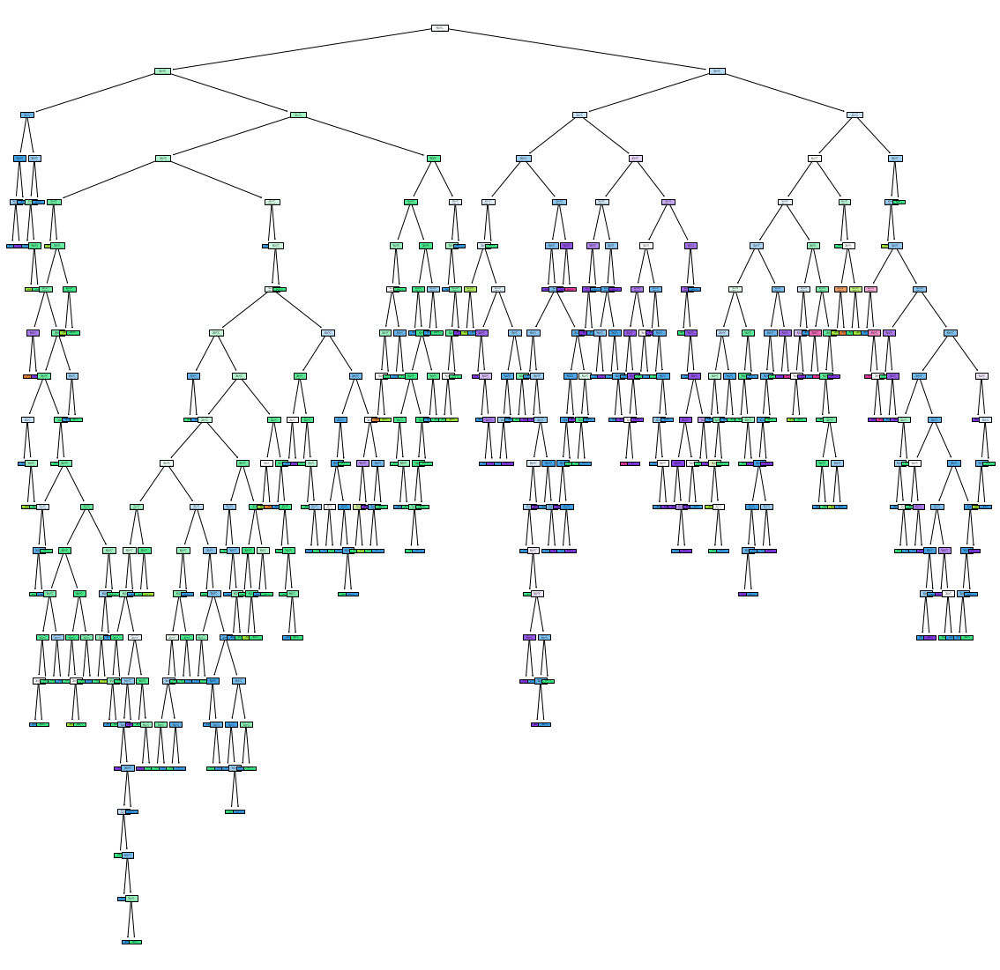

In [89]:
plt.figure(figsize = (20,20))
tree.plot_tree(rf.estimators_[0],filled = True)

[Text(415.29877514031807, 1060.02, 'X[1] <= 0.365\ngini = 0.653\nsamples = 784\nvalue = [7, 53, 520, 448, 158, 13]'),
 Text(117.18521983161834, 1005.6600000000001, 'X[3] <= 2.025\ngini = 0.644\nsamples = 148\nvalue = [0, 4, 28, 91, 82, 6]'),
 Text(52.72029934518241, 951.3000000000001, 'X[8] <= 3.225\ngini = 0.635\nsamples = 64\nvalue = [0, 3, 12, 47, 24, 4]'),
 Text(27.14312441534144, 896.94, 'X[4] <= 0.082\ngini = 0.29\nsamples = 28\nvalue = [0, 0, 0, 30, 4, 2]'),
 Text(16.703461178671656, 842.58, 'X[0] <= 11.7\ngini = 0.219\nsamples = 26\nvalue = [0, 0, 0, 28, 4, 0]'),
 Text(8.351730589335828, 788.22, 'X[8] <= 3.17\ngini = 0.128\nsamples = 23\nvalue = [0, 0, 0, 27, 2, 0]'),
 Text(4.175865294667914, 733.8600000000001, 'gini = 0.0\nsamples = 12\nvalue = [0, 0, 0, 15, 0, 0]'),
 Text(12.527595884003741, 733.8600000000001, 'X[6] <= 48.5\ngini = 0.245\nsamples = 11\nvalue = [0, 0, 0, 12, 2, 0]'),
 Text(8.351730589335828, 679.5, 'X[9] <= 0.935\ngini = 0.142\nsamples = 10\nvalue = [0, 0, 0, 

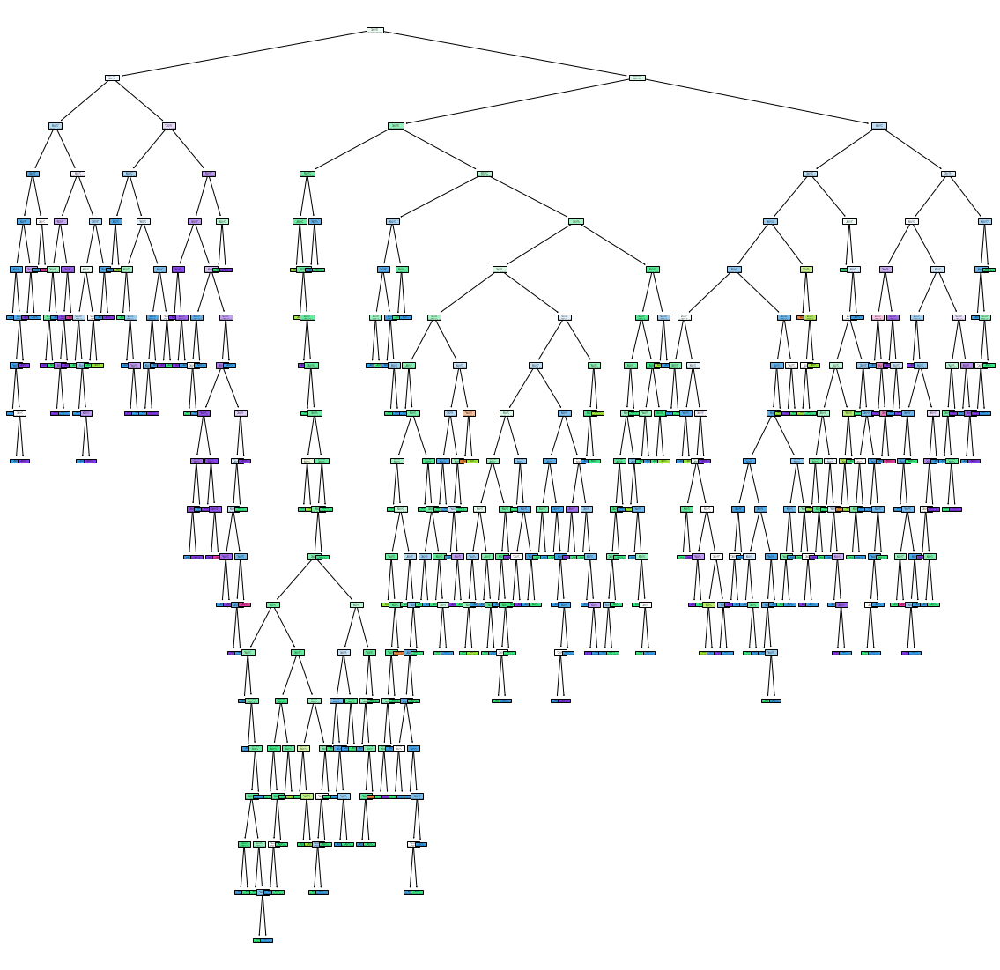

In [90]:
plt.figure(figsize = (20,20))
tree.plot_tree(rf.estimators_[1],filled = True)

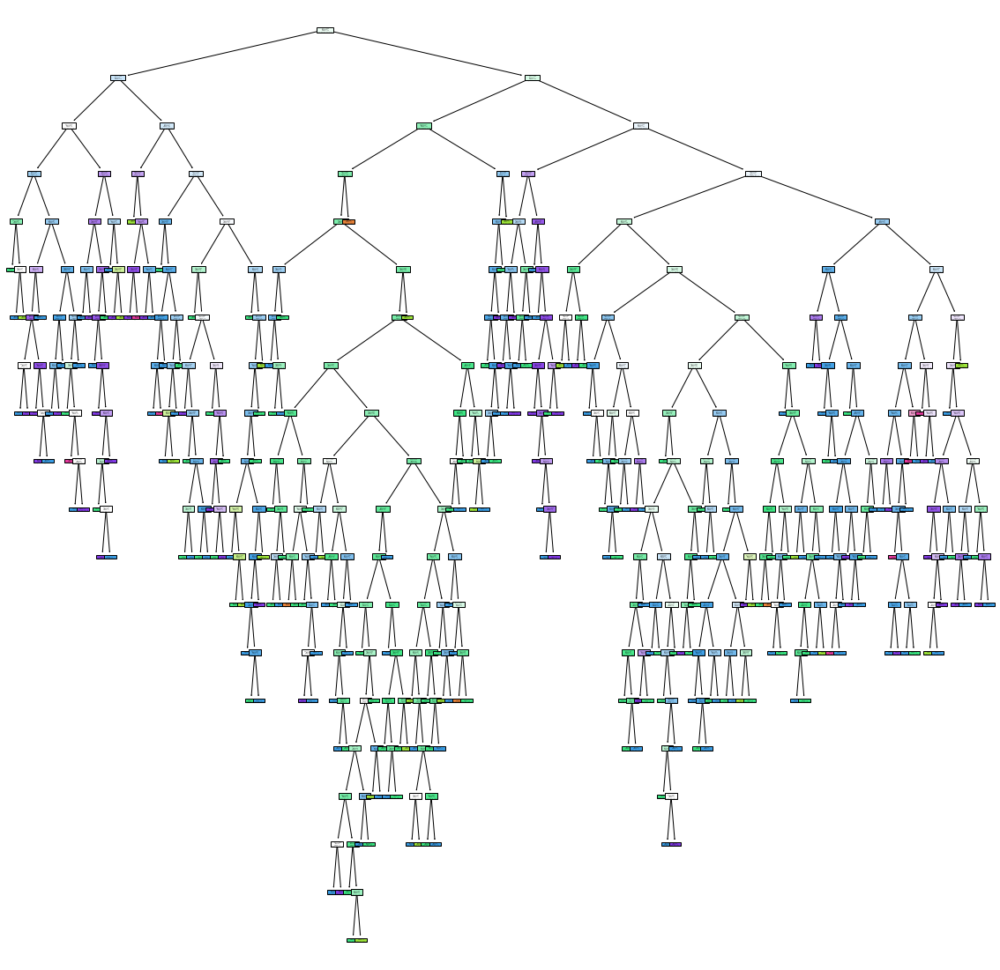

In [91]:
plt.figure(figsize = (20,20))
for i in range(len(rf.estimators_)):
    tree.plot_tree(rf.estimators_[i], filled = True)

In [93]:
grid_param = {
    "n_estimators":[5,10,100,120,150],
    "criterion":['gini','entropy'],
    "max_depth": range(10),
    "min_samples_leaf": range(10),
    
}

In [96]:
grid_search_rf = GridSearchCV(param_grid=grid_param, cv = 10,n_jobs=6, verbose=1,estimator = rf)

In [97]:
grid_search_rf.fit(x_train,y_train)

Fitting 10 folds for each of 1000 candidates, totalling 10000 fits


C:\Users\DELL\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: UserWarning: The least populated class in y has only 8 members, which is less than n_splits=10.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done  38 tasks      | elapsed:    4.1s
[Parallel(n_jobs=6)]: Done 784 tasks      | elapsed:   18.3s
[Parallel(n_jobs=6)]: Done 1284 tasks      | elapsed:   36.9s
[Parallel(n_jobs=6)]: Done 1984 tasks      | elapsed:  1.1min
[Parallel(n_jobs=6)]: Done 2884 tasks      | elapsed:  1.7min
[Parallel(n_jobs=6)]: Done 3984 tasks      | elapsed:  2.6min
[Parallel(n_jobs=6)]: Done 5284 tasks      | elapsed:  3.5min
[Parallel(n_jobs=6)]: Done 6952 tasks      | elapsed:  4.5min
[Parallel(n_jobs=6)]: Done 8406 tasks      | elapsed:  5.8min
[Parallel(n_jobs=6)]: Done 9482 tasks      | elapsed:  7.0min
[Parallel(n_jobs=6)]: Done 10000 out of 10000 | elapsed:  7.5min fin

GridSearchCV(cv=10, estimator=RandomForestClassifier(n_estimators=5), n_jobs=6,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': range(0, 10),
                         'min_samples_leaf': range(0, 10),
                         'n_estimators': [5, 10, 100, 120, 150]},
             verbose=1)

In [98]:
grid_search_rf.best_params_

{'criterion': 'entropy',
 'max_depth': 9,
 'min_samples_leaf': 1,
 'n_estimators': 150}

In [99]:
rf_new = RandomForestClassifier(criterion='entropy', max_depth=9,min_samples_leaf=1, n_estimators=150)

In [101]:
rf_new.fit(x_train,y_train)

RandomForestClassifier(criterion='entropy', max_depth=9, n_estimators=150)

In [102]:
rf_new.score(x_test,y_test)

0.6575

[Text(542.8937165775401, 1032.8400000000001, 'X[10] <= 10.55\nentropy = 1.687\nsamples = 764\nvalue = [8, 36, 530, 460, 156, 9]'),
 Text(262.1219919786096, 924.1200000000001, 'X[8] <= 3.295\nentropy = 1.354\nsamples = 469\nvalue = [7, 25, 447, 235, 24, 0]'),
 Text(93.6216577540107, 815.4000000000001, 'X[10] <= 9.85\nentropy = 1.167\nsamples = 239\nvalue = [0, 8, 248, 101, 11, 0]'),
 Text(44.75935828877005, 706.6800000000001, 'X[2] <= 0.075\nentropy = 0.885\nsamples = 168\nvalue = [0, 7, 210, 54, 0, 0]'),
 Text(38.79144385026738, 597.96, 'entropy = 0.0\nsamples = 15\nvalue = [0, 0, 33, 0, 0, 0]'),
 Text(50.72727272727273, 597.96, 'X[6] <= 109.5\nentropy = 0.953\nsamples = 153\nvalue = [0, 7, 177, 54, 0, 0]'),
 Text(38.79144385026738, 489.24, 'X[9] <= 1.805\nentropy = 1.069\nsamples = 120\nvalue = [0, 6, 122, 54, 0, 0]'),
 Text(32.8235294117647, 380.5200000000001, 'X[2] <= 0.255\nentropy = 1.023\nsamples = 119\nvalue = [0, 4, 122, 54, 0, 0]'),
 Text(17.90374331550802, 271.80000000000007,

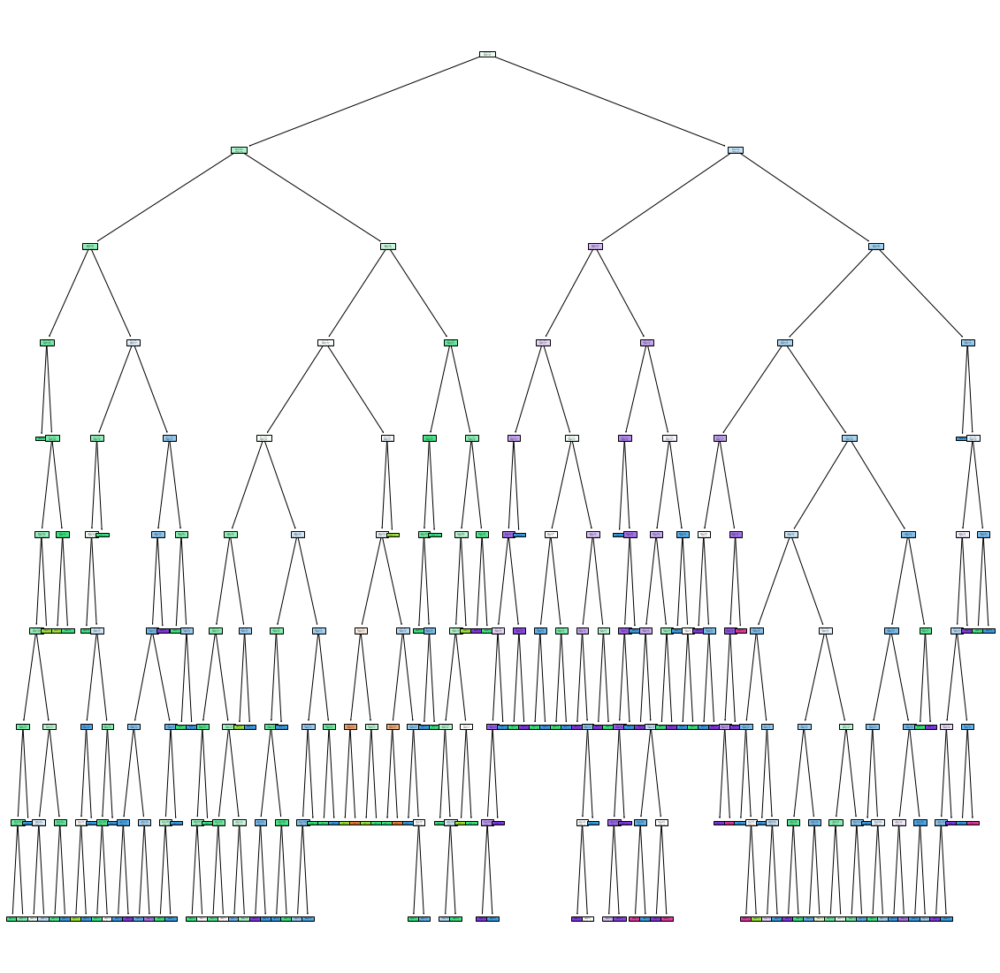

In [103]:
plt.figure(figsize = (20,20))
tree.plot_tree(rf_new.estimators_[0],filled = True)

In [104]:
df

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


In [105]:
x = df.drop(columns='quality')
y = df.quality

In [123]:
x_train,x_test,y_train,y_test=train_test_split(x,y,random_state=20)

In [124]:
knn = KNeighborsClassifier()

In [125]:
knn.fit(x_train,y_train)

KNeighborsClassifier()

In [126]:
knn.score(x_test,y_test)

0.5175

In [138]:
param = {
    'n_neighbors': [3,5,7,9,12,13,15,17,21],
    'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
    'leaf_size': [5,10,15,20,25,30,35,40,45],
    'p': [1,2],
    'weights':['uniform', 'distance']
    
}

In [139]:
grid_cv = GridSearchCV(knn,param_grid=param)

In [140]:
grid_cv.fit(x_train,y_train)

GridSearchCV(estimator=KNeighborsClassifier(n_neighbors=17, p=1),
             param_grid={'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
                         'leaf_size': [5, 10, 15, 20, 25, 30, 35, 40, 45],
                         'n_neighbors': [3, 5, 7, 9, 12, 13, 15, 17, 21],
                         'p': [1, 2], 'weights': ['uniform', 'distance']})

In [141]:
grid_cv.best_params_

{'algorithm': 'auto',
 'leaf_size': 5,
 'n_neighbors': 21,
 'p': 1,
 'weights': 'distance'}

In [144]:
knn = KNeighborsClassifier(n_neighbors=21, p= 1,weights= 'distance',leaf_size= 5,algorithm='auto')

In [145]:
knn.fit(x_train,y_train)

KNeighborsClassifier(leaf_size=5, n_neighbors=21, p=1, weights='distance')

In [146]:
knn.score(x_test,y_test)

0.6325

In [147]:
import pickle 
pickle.dump(knn,open("knn.pkl","wb"))

In [148]:
pwd()

'C:\\Users\\DELL\\Desktop\\Data Science\\Machine_learning'

In [149]:
#it is not advisable to use knn(lazy learner) in case of huge data set, it will 
#increase the train and test complexity.

In [151]:
knn.predict(x_test)

array([6, 5, 5, 5, 5, 6, 5, 6, 5, 6, 6, 5, 6, 5, 5, 5, 5, 6, 6, 6, 5, 6,
       6, 5, 7, 5, 5, 5, 5, 5, 5, 5, 5, 6, 5, 7, 6, 5, 6, 6, 5, 5, 6, 5,
       7, 5, 6, 6, 6, 6, 7, 5, 5, 5, 6, 6, 5, 5, 5, 6, 5, 5, 6, 5, 5, 5,
       5, 5, 6, 6, 5, 6, 6, 6, 5, 5, 6, 5, 5, 6, 5, 6, 6, 5, 5, 6, 5, 5,
       5, 5, 5, 6, 5, 6, 6, 6, 5, 6, 7, 5, 5, 5, 6, 6, 6, 6, 6, 5, 5, 6,
       5, 6, 5, 5, 5, 5, 5, 5, 5, 6, 5, 5, 5, 5, 6, 6, 6, 5, 6, 7, 6, 5,
       5, 6, 6, 5, 6, 6, 5, 7, 5, 6, 6, 5, 5, 6, 6, 6, 5, 6, 5, 5, 5, 6,
       6, 6, 5, 5, 5, 6, 6, 6, 6, 6, 5, 7, 5, 5, 5, 5, 5, 6, 5, 6, 6, 6,
       6, 6, 5, 5, 7, 6, 7, 5, 5, 6, 5, 5, 6, 5, 6, 5, 6, 6, 5, 7, 5, 6,
       6, 6, 6, 5, 6, 5, 6, 5, 6, 6, 5, 5, 6, 6, 5, 5, 6, 5, 6, 5, 5, 5,
       5, 5, 5, 6, 6, 7, 5, 6, 7, 6, 5, 5, 7, 6, 5, 5, 6, 6, 6, 5, 6, 7,
       7, 5, 6, 6, 5, 6, 5, 6, 5, 5, 6, 5, 5, 6, 7, 5, 5, 6, 6, 5, 5, 5,
       6, 6, 6, 7, 5, 5, 5, 7, 7, 6, 5, 7, 6, 5, 6, 5, 6, 6, 6, 5, 5, 5,
       5, 5, 5, 6, 6, 6, 6, 7, 7, 5, 5, 5, 6, 5, 5,

In [152]:
x_test

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
1508,7.1,0.27,0.60,2.1,0.074,17.0,25.0,0.99814,3.38,0.72,10.6
718,8.4,0.56,0.04,2.0,0.082,10.0,22.0,0.99760,3.22,0.44,9.6
1370,8.7,0.78,0.51,1.7,0.415,12.0,66.0,0.99623,3.00,1.17,9.2
579,10.6,0.31,0.49,2.2,0.063,18.0,40.0,0.99760,3.14,0.51,9.8
498,10.7,0.35,0.53,2.6,0.070,5.0,16.0,0.99720,3.15,0.65,11.0
...,...,...,...,...,...,...,...,...,...,...,...
1338,6.0,0.50,0.00,1.4,0.057,15.0,26.0,0.99448,3.36,0.45,9.5
860,7.2,0.62,0.06,2.7,0.077,15.0,85.0,0.99746,3.51,0.54,9.5
115,9.4,0.40,0.31,2.2,0.090,13.0,62.0,0.99660,3.07,0.63,10.5
1401,7.9,0.69,0.21,2.1,0.080,33.0,141.0,0.99620,3.25,0.51,9.9


In [153]:
x_test.iloc[0]

fixed acidity            7.10000
volatile acidity         0.27000
citric acid              0.60000
residual sugar           2.10000
chlorides                0.07400
free sulfur dioxide     17.00000
total sulfur dioxide    25.00000
density                  0.99814
pH                       3.38000
sulphates                0.72000
alcohol                 10.60000
Name: 1508, dtype: float64

In [154]:
knn.predict([x_test.iloc[0]])

array([6], dtype=int64)

In [155]:
#SVC Support Vector Machine

In [156]:
df

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


In [157]:
from sklearn.svm import SVC

In [158]:
svc = SVC()

In [159]:
svc.fit(x_train,y_train)

SVC()

In [160]:
svc.score(x_test,y_test)

0.5

In [174]:
svc_param = {
    'kernel':['linear', 'poly', 'rbf', 'sigmoid'],
    'C': [0.1,0.2,0.3,0.5,0.7,0.9,1.0,2.0,3.0],
    'gamma':[0.001,0.004,0.006,0.01,0.04,0.06]
}

In [175]:
svm_grid = GridSearchCV(svc,param_grid=svc_param, verbose = 3)

In [176]:
svm_grid.fit(x_train,y_train)

Fitting 5 folds for each of 216 candidates, totalling 1080 fits
[CV] C=0.1, gamma=0.001, kernel=linear ...............................


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV] ... C=0.1, gamma=0.001, kernel=linear, score=0.600, total=   0.5s
[CV] C=0.1, gamma=0.001, kernel=linear ...............................


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV] ... C=0.1, gamma=0.001, kernel=linear, score=0.525, total=   0.7s
[CV] C=0.1, gamma=0.001, kernel=linear ...............................


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    1.1s remaining:    0.0s


[CV] ... C=0.1, gamma=0.001, kernel=linear, score=0.575, total=   0.5s
[CV] C=0.1, gamma=0.001, kernel=linear ...............................
[CV] ... C=0.1, gamma=0.001, kernel=linear, score=0.600, total=   0.6s
[CV] C=0.1, gamma=0.001, kernel=linear ...............................
[CV] ... C=0.1, gamma=0.001, kernel=linear, score=0.548, total=   0.9s
[CV] C=0.1, gamma=0.001, kernel=poly .................................
[CV] ..... C=0.1, gamma=0.001, kernel=poly, score=0.517, total=   0.3s
[CV] C=0.1, gamma=0.001, kernel=poly .................................
[CV] ..... C=0.1, gamma=0.001, kernel=poly, score=0.500, total=   0.3s
[CV] C=0.1, gamma=0.001, kernel=poly .................................
[CV] ..... C=0.1, gamma=0.001, kernel=poly, score=0.479, total=   0.4s
[CV] C=0.1, gamma=0.001, kernel=poly .................................
[CV] ..... C=0.1, gamma=0.001, kernel=poly, score=0.483, total=   0.2s
[CV] C=0.1, gamma=0.001, kernel=poly .................................
[CV] .

[CV] .... C=0.1, gamma=0.01, kernel=linear, score=0.600, total=   0.5s
[CV] C=0.1, gamma=0.01, kernel=linear ................................
[CV] .... C=0.1, gamma=0.01, kernel=linear, score=0.525, total=   0.7s
[CV] C=0.1, gamma=0.01, kernel=linear ................................
[CV] .... C=0.1, gamma=0.01, kernel=linear, score=0.575, total=   0.5s
[CV] C=0.1, gamma=0.01, kernel=linear ................................
[CV] .... C=0.1, gamma=0.01, kernel=linear, score=0.600, total=   0.6s
[CV] C=0.1, gamma=0.01, kernel=linear ................................
[CV] .... C=0.1, gamma=0.01, kernel=linear, score=0.548, total=   0.9s
[CV] C=0.1, gamma=0.01, kernel=poly ..................................
[CV] ...... C=0.1, gamma=0.01, kernel=poly, score=0.604, total=  21.8s
[CV] C=0.1, gamma=0.01, kernel=poly ..................................
[CV] ...... C=0.1, gamma=0.01, kernel=poly, score=0.550, total=  16.8s
[CV] C=0.1, gamma=0.01, kernel=poly ..................................
[CV] .

KeyboardInterrupt: 

In [ ]:
svm_grid.best_params_

In [169]:
svc1 = SVC(kernel = 'linear')
svc1.fit(x_train,y_train)
svc1.score(x_test,y_test)

0.5925

In [178]:
df = pd.read_csv('Admission_Prediction.csv')

In [179]:
df

,Serial No.,GRE Score,TOEFL Score,University Rating,SOP,LOR,CGPA,Research,Chance of Admit
0,1,337.0,118.0,4.0,4.5,4.5,9.65,1,0.92
1,2,324.0,107.0,4.0,4.0,4.5,8.87,1,0.76
2,3,NaN,104.0,3.0,3.0,3.5,8.00,1,0.72
3,4,322.0,110.0,3.0,3.5,2.5,8.67,1,0.80
4,5,314.0,103.0,2.0,2.0,3.0,8.21,0,0.65
...,...,...,...,...,...,...,...,...,...
495,496,332.0,108.0,5.0,4.5,4.0,9.02,1,0.87
496,497,337.0,117.0,5.0,5.0,5.0,9.87,1,0.96
497,498,330.0,120.0,5.0,4.5,5.0,9.56,1,0.93
498,499,312.0,103.0,4.0,4.0,5.0,8.43,0,0.73


In [180]:
x = df.drop(columns=["Serial No.","Chance of Admit"])

In [181]:
x

,GRE Score,TOEFL Score,University Rating,SOP,LOR,CGPA,Research
0,337.0,118.0,4.0,4.5,4.5,9.65,1
1,324.0,107.0,4.0,4.0,4.5,8.87,1
2,NaN,104.0,3.0,3.0,3.5,8.00,1
3,322.0,110.0,3.0,3.5,2.5,8.67,1
4,314.0,103.0,2.0,2.0,3.0,8.21,0
...,...,...,...,...,...,...,...
495,332.0,108.0,5.0,4.5,4.0,9.02,1
496,337.0,117.0,5.0,5.0,5.0,9.87,1
497,330.0,120.0,5.0,4.5,5.0,9.56,1
498,312.0,103.0,4.0,4.0,5.0,8.43,0


In [183]:
y = df["Chance of Admit"]

In [184]:
y

0      0.92
1      0.76
2      0.72
3      0.80
4      0.65
       ... 
495    0.87
496    0.96
497    0.93
498    0.73
499    0.84
Name: Chance of Admit, Length: 500, dtype: float64

In [185]:
x_train,x_test,y_train,y_test= train_test_split(x,y,random_state=30,test_size=0.20)

In [186]:
from sklearn.svm import SVR

In [187]:
svr = SVR()

In [190]:
svr.fit(x_train,y_train)

ValueError: Input contains NaN, infinity or a value too large for dtype('float64').

In [192]:
df.isna().sum()

Serial No.            0
GRE Score            15
TOEFL Score          10
University Rating    15
SOP                   0
LOR                   0
CGPA                  0
Research              0
Chance of Admit       0
dtype: int64

In [193]:
df["GRE Score"] = df["GRE Score"].fillna(df["GRE Score"].mean())

In [194]:
df["TOEFL Score"] = df["TOEFL Score"].fillna(df["TOEFL Score"].mean())

In [195]:
df["University Rating"] = df["University Rating"].fillna(df["University Rating"].mean())

In [196]:
df.isna().sum()

Serial No.           0
GRE Score            0
TOEFL Score          0
University Rating    0
SOP                  0
LOR                  0
CGPA                 0
Research             0
Chance of Admit      0
dtype: int64

In [197]:
x = df.drop(columns=["Serial No.","Chance of Admit"])
y = df["Chance of Admit"]
x_train,x_test,y_train,y_test= train_test_split(x,y,random_state=30,test_size=0.20)
svr = SVR()
svr.fit(x_train,y_train)

SVR()

In [198]:
from sklearn.metrics import r2_score
r2_score(y_test,svr.predict(x_test))

0.6774861142346673

In [199]:
svr.predict([x.iloc[0]])

array([0.89252382])

In [200]:
y[0]

0.92

# STACKING

In [203]:
import pandas as pd
import numpy as np
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn import tree
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier

In [209]:
data = pd.read_csv('winequality_red.csv', sep=';')

In [210]:
data

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


In [211]:
x = data.drop(columns=["quality"])

In [212]:
y = data.quality

In [ ]:
# divide the original data set into one division and from that diision take a subset of that data of training and testing

In [219]:
train, val_train, test, val_test = train_test_split(x,y,random_state =30 ,test_size = 0.50)

In [220]:
x_train,x_test,y_train,y_test= train_test_split(x,y,random_state=30,test_size=0.20)

In [221]:
knn = KNeighborsClassifier()
knn.fit(x_train,y_train)

KNeighborsClassifier()

In [222]:
knn.score(x_test,y_test)

0.5

In [223]:
svc = SVC()
svc.fit(x_train,y_train)
svc.score(x_test,y_test)

0.515625

In [224]:
knn_prediction = knn.predict(val_train)
prediction_svc = svc.predict(val_train)

In [225]:
knn_prediction

array([7, 5, 6, 5, 5, 5, 5, 5, 6, 5, 6, 5, 6, 6, 7, 6, 5, 6, 5, 5, 5, 6,
       5, 5, 5, 6, 6, 5, 5, 6, 5, 6, 6, 5, 6, 6, 6, 6, 5, 7, 5, 6, 5, 4,
       6, 7, 6, 5, 5, 6, 5, 5, 6, 6, 5, 5, 5, 5, 5, 5, 5, 5, 6, 6, 5, 5,
       5, 6, 5, 4, 5, 5, 5, 5, 6, 6, 7, 5, 5, 6, 6, 7, 7, 5, 5, 5, 6, 6,
       5, 6, 6, 6, 5, 6, 6, 7, 5, 7, 5, 7, 6, 5, 5, 7, 6, 6, 6, 5, 5, 5,
       5, 6, 5, 6, 7, 6, 6, 6, 6, 5, 6, 6, 7, 6, 5, 5, 6, 6, 6, 6, 6, 5,
       5, 5, 7, 5, 5, 5, 6, 7, 7, 5, 5, 5, 6, 5, 5, 5, 5, 7, 5, 5, 5, 5,
       5, 7, 6, 7, 7, 5, 5, 6, 6, 5, 6, 5, 5, 6, 7, 6, 6, 6, 5, 6, 5, 5,
       5, 5, 6, 6, 5, 6, 6, 5, 5, 6, 5, 7, 6, 6, 5, 5, 6, 5, 7, 5, 6, 5,
       5, 6, 6, 6, 6, 5, 5, 6, 7, 6, 6, 6, 6, 5, 5, 5, 5, 5, 5, 6, 7, 5,
       6, 6, 5, 6, 6, 5, 6, 5, 6, 5, 6, 6, 5, 6, 6, 5, 5, 6, 5, 6, 5, 6,
       5, 6, 5, 6, 6, 5, 6, 6, 5, 6, 5, 6, 5, 5, 5, 5, 5, 5, 5, 5, 6, 6,
       5, 5, 6, 6, 6, 6, 5, 5, 6, 5, 5, 6, 4, 6, 5, 6, 5, 5, 5, 6, 6, 5,
       7, 6, 5, 7, 5, 4, 6, 7, 5, 6, 5, 5, 5, 6, 5,

In [226]:
prediction_svc

array([6, 6, 6, 5, 6, 5, 6, 5, 5, 5, 6, 5, 6, 6, 5, 6, 6, 5, 6, 5, 6, 6,
       6, 5, 6, 6, 6, 6, 5, 6, 5, 6, 6, 6, 6, 6, 6, 6, 6, 6, 5, 6, 6, 6,
       6, 6, 6, 6, 6, 6, 6, 6, 6, 5, 6, 5, 5, 5, 5, 5, 6, 5, 6, 6, 5, 5,
       5, 6, 5, 6, 5, 5, 6, 6, 6, 6, 6, 5, 6, 6, 6, 6, 5, 6, 5, 6, 5, 6,
       5, 6, 5, 6, 5, 6, 6, 6, 5, 6, 5, 6, 5, 6, 6, 6, 6, 6, 6, 5, 6, 5,
       5, 5, 5, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 5, 6, 6, 6, 5, 5, 5,
       6, 6, 6, 6, 6, 6, 6, 6, 6, 5, 5, 5, 6, 5, 6, 6, 6, 6, 5, 5, 6, 6,
       6, 6, 6, 6, 6, 6, 5, 6, 5, 5, 6, 5, 6, 6, 6, 6, 6, 5, 6, 6, 6, 6,
       5, 5, 6, 6, 5, 6, 6, 5, 5, 6, 6, 6, 5, 6, 5, 6, 6, 5, 6, 6, 6, 5,
       6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 5, 5, 5, 6, 6, 5,
       6, 6, 5, 6, 6, 6, 6, 5, 6, 6, 6, 6, 6, 6, 6, 6, 5, 6, 6, 6, 5, 6,
       6, 6, 5, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 5, 5, 5, 6, 5, 5, 6, 6,
       6, 5, 6, 5, 6, 6, 5, 6, 6, 6, 5, 6, 6, 6, 6, 6, 6, 5, 6, 6, 6, 5,
       6, 6, 5, 6, 5, 6, 6, 6, 6, 6, 5, 5, 5, 5, 5,

In [230]:
imput3 = np.column_stack((prediction_svc,knn_prediction))

In [228]:
output = val_test

In [229]:
output

1147    7
659     4
871     5
1333    5
1411    6
       ..
1073    6
200     7
942     7
1106    6
1329    6
Name: quality, Length: 800, dtype: int64

In [232]:
imput3

array([[6, 7],
       [6, 5],
       [6, 6],
       ...,
       [5, 6],
       [6, 6],
       [5, 6]], dtype=int64)

In [233]:
rf = RandomForestClassifier()

In [234]:
rf.fit(imput3,output)

RandomForestClassifier()